# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [75]:
# Libraries for data loading, data manipulation and data visulisation
import pandas as pd
import numpy as np
import statistics
from numpy import set_printoptions
import datetime
from dateutil.parser import parse
from datetime import datetime
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib import rc
%config InlineBackend.figure_format = 'retina' # Plotting Pretty figures and avoiding blurry images
sns.set_context('notebook') # Larger scale for plots in notebooks
## from skimpy import skim

# Plotting Pretty figures and avoiding blurry images
%config InlineBackend.figure_format = 'retina'

# Larger scale for plots in notebooks
sns.set_context('notebook')

# Libraries for data preparation and model building
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import mean_squared_error as MSE
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
import math
from statsmodels.graphics.correlation import plot_corr
import statsmodels.formula.api as sm
from statsmodels.formula.api import ols
from scipy.stats import pearsonr
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn import metrics

# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')
## from wordcloud import WordCloud

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [3]:
# load the data
df = pd.read_csv('df_train.csv')
df_test = pd.read_csv('df_test.csv')
# expand all the columns 
pd.set_option('display.max_columns', 500) 


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


## BASIC ANALYSIS

In [4]:
# Check the first five rows of the dataset
df.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_pressure,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Madrid_pressure,Valencia_temp_max,Valencia_temp,Bilbao_weather_id,Seville_temp,Valencia_humidity,Valencia_temp_min,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,42.666667,0.0,3.333333,0.0,sp25,0.0,0.0,1036.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.000000,800.0,1002.666667,274.254667,971.333333,269.888000,269.888000,800.0,274.254667,75.666667,269.888000,281.013000,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,139.000000,0.0,3.333333,0.0,sp25,0.0,0.0,1037.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.666667,800.0,1004.333333,274.945000,972.666667,271.728333,271.728333,800.0,274.945000,71.000000,271.728333,280.561667,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,326.000000,0.0,2.666667,0.0,sp25,0.0,0.0,1038.000000,0.0,0.0,0.0,0.0,800.0,800.0,1036.000000,800.0,1005.333333,278.792000,974.000000,278.008667,278.008667,800.0,278.792000,65.666667,278.008667,281.583667,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,273.000000,0.0,4.000000,0.0,sp25,0.0,0.0,1037.000000,0.0,0.0,0.0,0.0,800.0,800.0,1036.000000,800.0,1009.000000,285.394000,994.666667,284.899552,284.899552,800.0,285.394000,54.000000,284.899552,283.434104,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,260.000000,0.0,3.000000,0.0,sp25,0.0,0.0,1035.000000,0.0,0.0,0.0,0.0,800.0,800.0,1035.333333,800.0,NaN,285.513719,1035.333333,283.015115,283.015115,800.0,285.513719,58.333333,283.015115,284.213167,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


Looking at the top five rows of our data we can see all our features as well as the types of data we are working with.

- 'time'
- 'Madrid_wind_speed'
- 'Valencia_wind_deg'
- 'Bilbao_rain_1h' 
- 'Valencia_wind_speed'
- 'Seville_humidity'
- 'Madrid_humidity' 
- 'Bilbao_clouds_all'
- 'Bilbao_wind_speed',
- 'Seville_clouds_all' 
- 'Bilbao_wind_deg' 
- 'Barcelona_wind_speed'
- 'Barcelona_wind_deg'
- 'Madrid_clouds_all'
- 'Seville_wind_speed'
- 'Barcelona_rain_1h'
- 'Seville_pressure'
- 'Seville_rain_1h'
- 'Bilbao_snow_3h'
- 'Barcelona_pressure'
- 'Seville_rain_3h'
- 'Madrid_rain_1h'
- 'Barcelona_rain_3h'
- 'Valencia_snow_3h',
- 'Madrid_weather_id'
- 'Barcelona_weather_id'
- 'Bilbao_pressure',
- 'Seville_weather_id'
- 'Valencia_pressure'
- 'Seville_temp_max'
- 'Madrid_pressure'
- 'Valencia_temp_max'
- 'Valencia_temp',
- 'Bilbao_weather_id'
- 'Seville_temp'
- 'Valencia_humidity' 
- 'Valencia_temp_min'
- 'Barcelona_temp_max'
- 'Madrid_temp_max',
- 'Barcelona_temp'
- 'Bilbao_temp_min'
- 'Bilbao_temp',
- 'Barcelona_temp_min'
- 'Bilbao_temp_max' 
- 'Seville_temp_min'
- 'Madrid_temp'
- 'Madrid_temp_min'
- 'load_shortfall_3h'
      


Opps! There is the `Unnamed : 0` Column which serves as index, we don't need this, we will delete it immediately.

In [5]:
# Delete the Unnamed: 0 column
del df['Unnamed: 0']

In [6]:
# Check the shape of the dataset
df.shape

(8763, 48)

The shape command shows us that we have 8763 rows of data and 48 features.

In [7]:
#

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  8763 non-null   object 
 1   Madrid_wind_speed     8763 non-null   float64
 2   Valencia_wind_deg     8763 non-null   object 
 3   Bilbao_rain_1h        8763 non-null   float64
 4   Valencia_wind_speed   8763 non-null   float64
 5   Seville_humidity      8763 non-null   float64
 6   Madrid_humidity       8763 non-null   float64
 7   Bilbao_clouds_all     8763 non-null   float64
 8   Bilbao_wind_speed     8763 non-null   float64
 9   Seville_clouds_all    8763 non-null   float64
 10  Bilbao_wind_deg       8763 non-null   float64
 11  Barcelona_wind_speed  8763 non-null   float64
 12  Barcelona_wind_deg    8763 non-null   float64
 13  Madrid_clouds_all     8763 non-null   float64
 14  Seville_wind_speed    8763 non-null   float64
 15  Barcelona_rain_1h    

In [8]:
df.isna().sum()

time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2068
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp  

The `Valencia_pressure` has missing records of 2068, this is quite large, let's check the percentage composition of this.

## Univariate Non Graphical Analysis

In [9]:
# look at data statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Madrid_wind_speed,8763.0,2.425729,1.850371,0.000000,1.000000,2.000000,3.333333,1.300000e+01
Bilbao_rain_1h,8763.0,0.135753,0.374901,0.000000,0.000000,0.000000,0.100000,3.000000e+00
Valencia_wind_speed,8763.0,2.586272,2.411190,0.000000,1.000000,1.666667,3.666667,5.200000e+01
Seville_humidity,8763.0,62.658793,22.621226,8.333333,44.333333,65.666667,82.000000,1.000000e+02
Madrid_humidity,8763.0,57.414717,24.335396,6.333333,36.333333,58.000000,78.666667,1.000000e+02
Bilbao_clouds_all,8763.0,43.469132,32.551044,0.000000,10.000000,45.000000,75.000000,1.000000e+02
Bilbao_wind_speed,8763.0,1.850356,1.695888,0.000000,0.666667,1.000000,2.666667,1.266667e+01
Seville_clouds_all,8763.0,13.714748,24.272482,0.000000,0.000000,0.000000,20.000000,9.733333e+01
Bilbao_wind_deg,8763.0,158.957511,102.056299,0.000000,73.333333,147.000000,234.000000,3.593333e+02
Barcelona_wind_speed,8763.0,2.870497,1.792197,0.000000,1.666667,2.666667,4.000000,1.266667e+01


Looking at the summary statistics, we can identify some potential issues, some of them are as follows:

- The range of the data (Max - Min) is too wide from feature to feature, we would need to rescale the data.

- Also their are some exagerated figures (which could be potential outliers) this would be explored in great details.

- The standard deviation of the data is too far apart, We will standardize the data.

- We can tell from the Mean(average) that some of the columns such as Barcelona Pressure, Bilbao Pressure, Valencia Pressure etc. show very large values which is far from the range.


## Checking Skewness/Kurtosis and Outliers
Skewness is simply the measure of symmetry or more precisely, the lack of symmetry.

Kurtosis is the measure of how heavy its tails are compared to a normal distribution(majorly to determine outliers)

In [10]:
df.skew()


Madrid_wind_speed        1.441144
Bilbao_rain_1h           5.222802
Valencia_wind_speed      3.499637
Seville_humidity        -0.310175
Madrid_humidity         -0.057378
Bilbao_clouds_all       -0.053085
Bilbao_wind_speed        1.716914
Seville_clouds_all       1.814452
Bilbao_wind_deg          0.226927
Barcelona_wind_speed     1.057331
Barcelona_wind_deg      -0.180001
Madrid_clouds_all        1.246745
Seville_wind_speed       1.151006
Barcelona_rain_1h        8.726988
Seville_rain_1h          8.067341
Bilbao_snow_3h          26.177568
Barcelona_pressure      57.979664
Seville_rain_3h         19.342574
Madrid_rain_1h           7.074308
Barcelona_rain_3h       12.696605
Valencia_snow_3h        63.298084
Madrid_weather_id       -3.107722
Barcelona_weather_id    -2.584011
Bilbao_pressure         -0.999642
Seville_weather_id      -3.275574
Valencia_pressure       -1.705162
Seville_temp_max        -0.033931
Madrid_pressure         -1.850768
Valencia_temp_max        0.082672
Valencia_temp 

The following features have high positive symmetrical data; Bilbao_snow_3h, Barcelona_pressure, Seville_rain_3h, Barcelona_rain_3h and Valencia_snow_3h.
Madrid_weather_id, Barcelona_weather_id and Seville_weather_id have data with high negative symmetry.
It is also noted that this features are also identified as outliers.

In [11]:
df.kurtosis()

Madrid_wind_speed          2.036462
Bilbao_rain_1h            32.904656
Valencia_wind_speed       35.645426
Seville_humidity          -1.017983
Madrid_humidity           -1.167537
Bilbao_clouds_all         -1.533417
Bilbao_wind_speed          3.631565
Seville_clouds_all         2.155921
Bilbao_wind_deg           -1.083530
Barcelona_wind_speed       1.493635
Barcelona_wind_deg        -0.959160
Madrid_clouds_all          0.142079
Seville_wind_speed         1.398580
Barcelona_rain_1h        101.578931
Seville_rain_1h           93.840746
Bilbao_snow_3h           806.128471
Barcelona_pressure      3687.564230
Seville_rain_3h          413.136592
Madrid_rain_1h            76.584491
Barcelona_rain_3h        187.800460
Valencia_snow_3h        4089.323165
Madrid_weather_id          9.259047
Barcelona_weather_id       5.701882
Bilbao_pressure            1.825323
Seville_weather_id        10.710308
Valencia_pressure          2.211823
Seville_temp_max          -0.515989
Madrid_pressure            2

Below are features with large numbers of outliers as shown by kurtosis > 3;
Bilbao_rain_1h, Valencia_wind_speed, Barcelona_rain_1h, Seville_rain_1h, Bilbao_snow_3h, Barcelona_pressure, Seville_rain_3h, Valencia_snow_3h, Barcelona_rain_3h, Madrid_weather_id, Barcelona_weather_id and Seville_weather_id.

The outliers observed in Barcelona_pressure are definitely due to some sort of error, as a pressure of 3687.564230 is too high. The maximum pressure recorded in history is 1084, and the maximum pressure for the other cities in the dataset are also below this value.
This value can be replaced or dropped during data engineering.
Valencia_wind_speed has a maximum of 52, there is also something wrong with that value. The highest wind speed recorded in history is 20.This value should also be replaced or dropped.
The outliers in the other features can maybe be attributed to a significant change in weather conditions on the day that the data was collected and hence we can leave them.

In [12]:
#df.skew().plot(kind= 'bar', figsize = (20,10));

## Univariate Analysis: Graphical


In [13]:
# plot relevant feature interactions

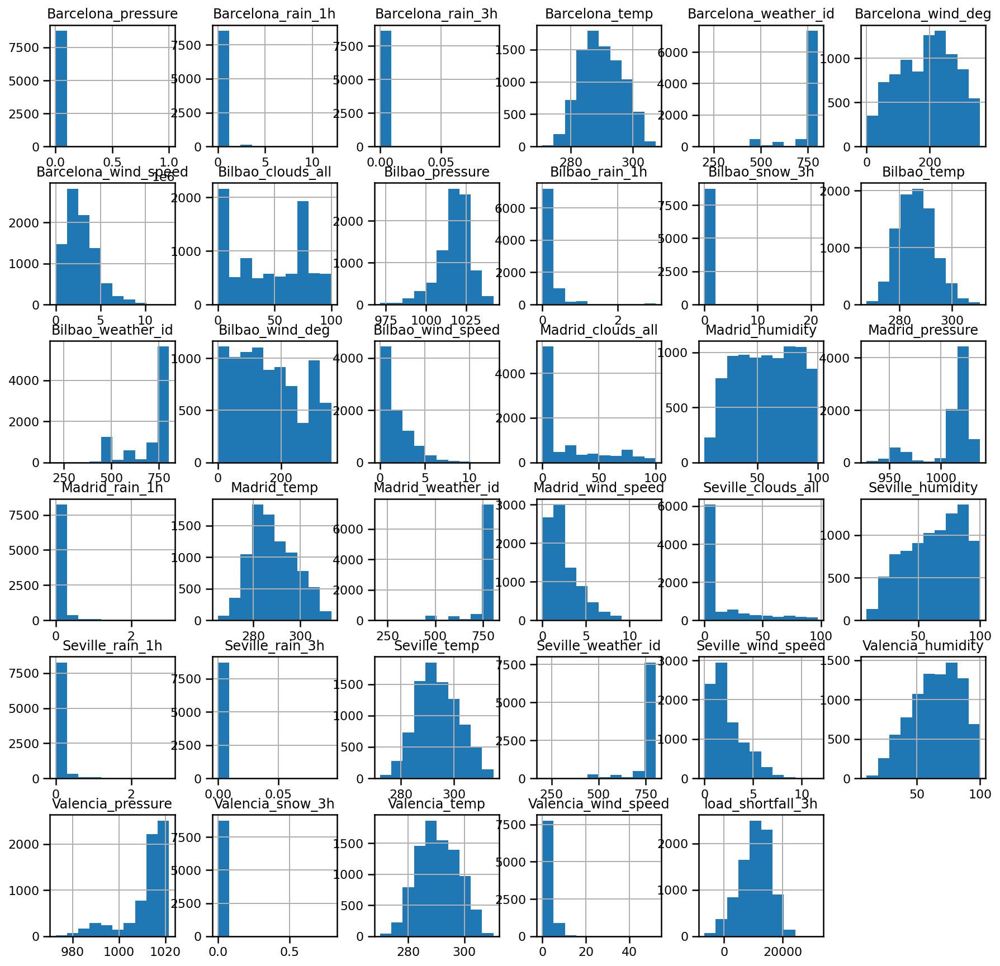

In [14]:
features = ['Barcelona_pressure',
        'Barcelona_rain_1h',
        'Barcelona_rain_3h',
        'Barcelona_temp',
        'Barcelona_weather_id',
        'Barcelona_wind_deg',
        'Barcelona_wind_speed',
        'Bilbao_clouds_all',
        'Bilbao_pressure',
        'Bilbao_rain_1h',
        'Bilbao_snow_3h',
        'Bilbao_temp',
        'Bilbao_weather_id',
        'Bilbao_wind_deg',
        'Bilbao_wind_speed',
        'Madrid_clouds_all',
        'Madrid_humidity',
        'Madrid_pressure',
        'Madrid_rain_1h',
        'Madrid_temp',
        'Madrid_weather_id',
        'Madrid_wind_speed',
        'Seville_clouds_all',
        'Seville_humidity',
        'Seville_pressure',
        'Seville_rain_1h',
        'Seville_rain_3h',
        'Seville_temp',
        'Seville_weather_id',
        'Seville_wind_speed',
        'Valencia_humidity',
        'Valencia_pressure',
        'Valencia_snow_3h',
        'Valencia_temp',
        'Valencia_wind_deg',
        'Valencia_wind_speed',
        'load_shortfall_3h'] # create a list of all numerical features

df[features].hist(figsize=(15,15));

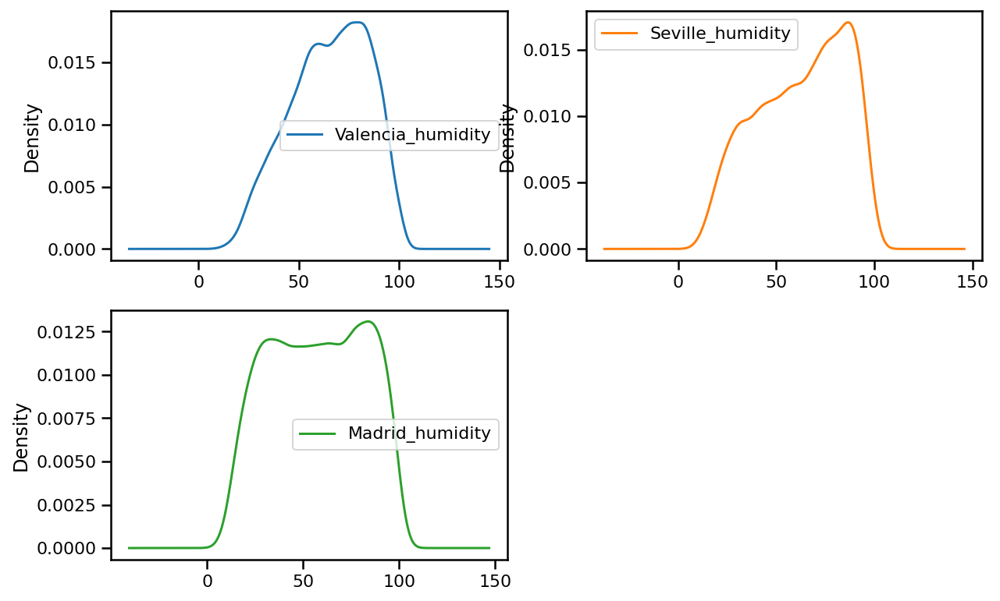

In [15]:
features2 = ['Valencia_humidity', 'Seville_humidity', 'Madrid_humidity']

df[features2].plot(kind='density', subplots=True, layout=(3, 2), sharex=False, figsize=(10, 10));

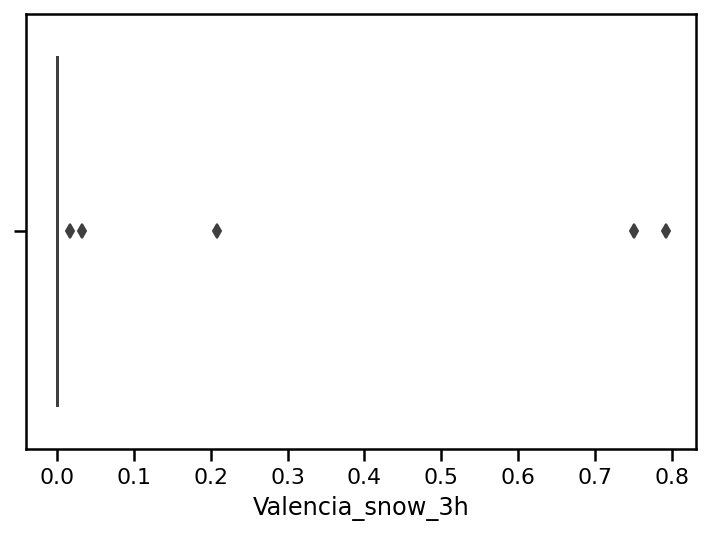

In [16]:
sns.boxplot(x='Valencia_snow_3h', data=df);

- The boxplot shows that Valencia_snow_3h has about five outliers

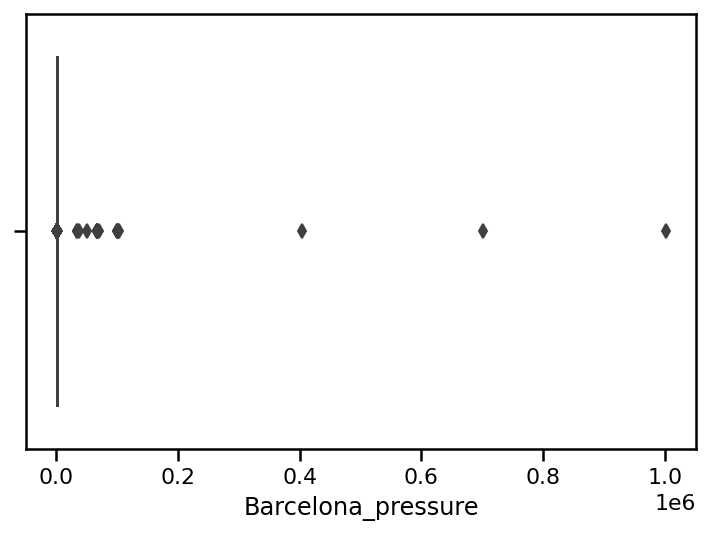

In [17]:
sns.boxplot(x='Barcelona_pressure', data=df);


- The boxplot shows that Barcelona_pressure has about seven outliers

- We then looked at values that are greater than the maximum pressure ever recorded (1084).

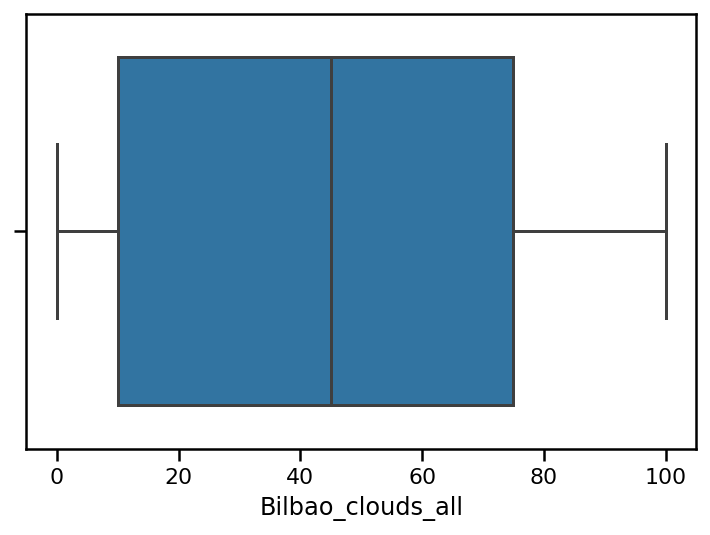

In [18]:

sns.boxplot(x='Bilbao_clouds_all', data=df);

The boxplot shows that Bilbao_clouds_all is free from outliers as confirmed by the kurtosis coefficient. 

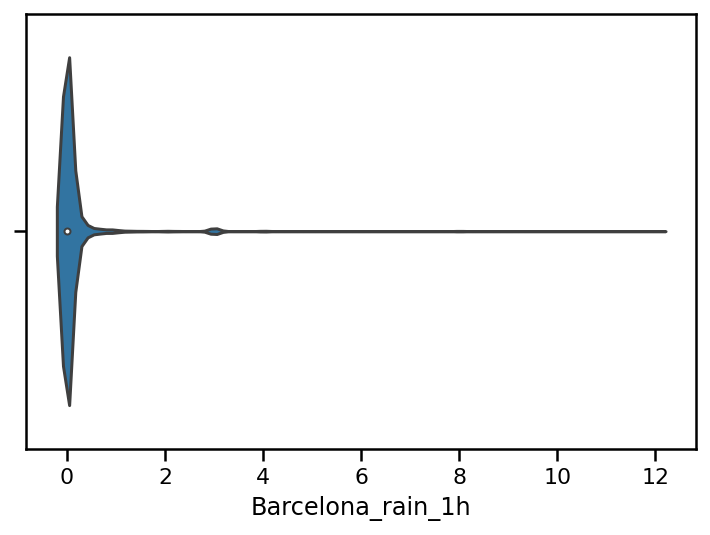

In [19]:
sns.violinplot(x='Barcelona_rain_1h', data=df);

The voilin plots also the presence of outliers

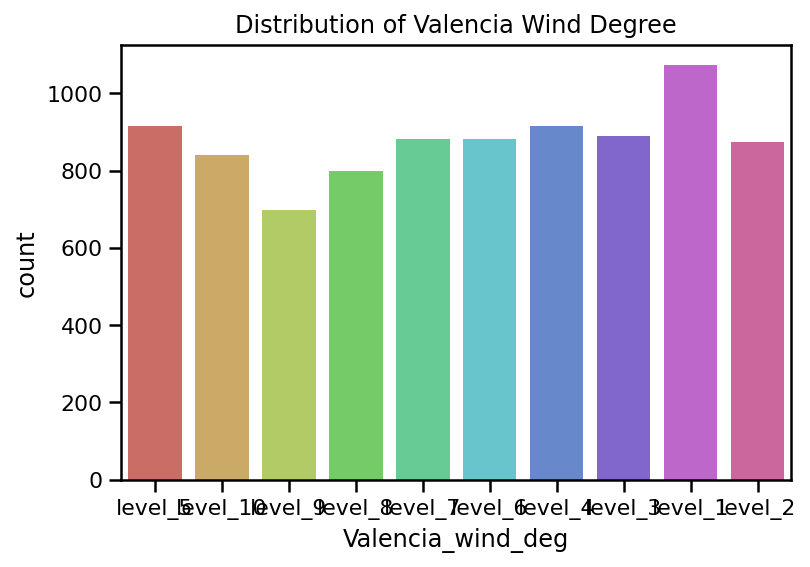

In [20]:
sns.countplot(x = 'Valencia_wind_deg', data = df, palette="hls")
plt.title("Distribution of Valencia Wind Degree");

A chart showing the distribution of valencia Wind Degree according to each levels.

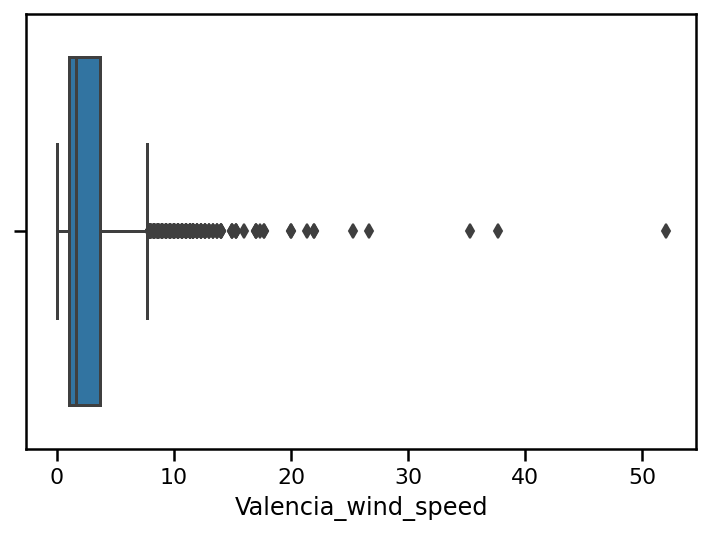

In [21]:
#Visualizing the Valencia_wind_speed data
sns.boxplot(x='Valencia_wind_speed', data=df);

We can see that there is a significant number of outliers in this feature

## Multivariate Non-Graphical

In [22]:
df_corr = df.corr()

## Multivariate Analysis: Graphical


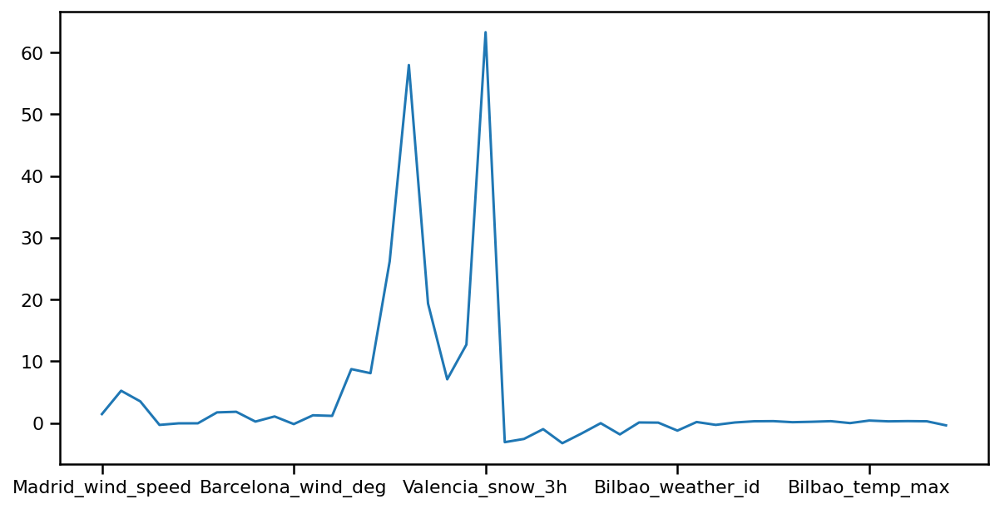

In [23]:
#Checking for outliers in the different columns
plt.figure(figsize = [10,5])
df.skew(axis=0, skipna=True).plot();

## An Overview of our Target Variable with Time

In [24]:
#Ploting time against Load_shortfall_3h to see relationship
fig = px.line(df, y = df['load_shortfall_3h'], x =df['time'], width =900, height=400 )
fig.show()

We can tell from the image the seasonality in the time axis on their load_shortfall_3h values, We will need to desample (break them into bits) this image to get a better understanding of the graph

To do this we will have to desample the time into:

- Year
- Months
- Weeks
- Days
- Hours

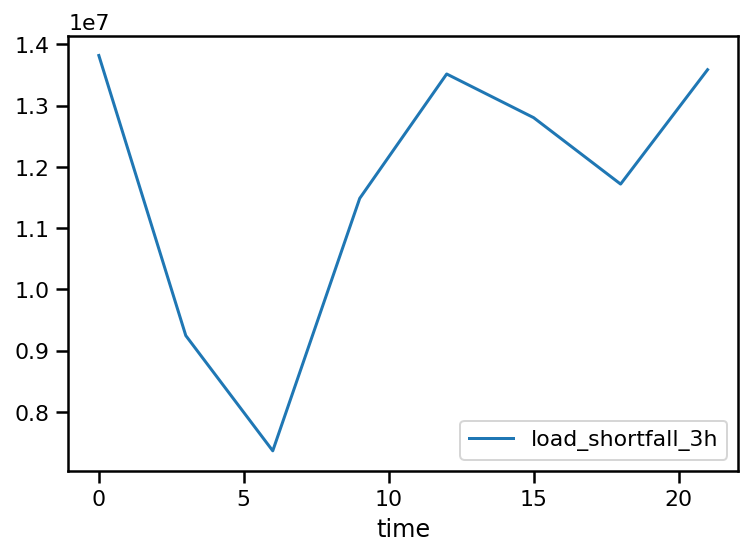

In [25]:
df.groupby([df['time'].astype('datetime64').dt.hour])['load_shortfall_3h'].sum().plot(legend = True);

In [26]:
px.line(df.groupby([df['time'].astype('datetime64').dt.year])['load_shortfall_3h'].mean(),
        title = 'Load_shortfall_3h grouped by Year',
        y='load_shortfall_3h',width =800, height=400 )


The yearly Load_short_fall plots indicates an increase in load short fall from 2016 down to 2017 surpassing the previous years

In [27]:
px.line(df.groupby([df['time'].astype('datetime64').dt.month])['load_shortfall_3h'].mean(),
        title = 'Load_shortfall_3h grouped by Month of Year',
        y='load_shortfall_3h', width =800, height=400)


Also the plot above, indicates a higher 'load short fall' from middle of June down to December

In [28]:
px.line(df.groupby([df['time'].astype('datetime64').dt.weekofyear])['load_shortfall_3h'].mean(), 
        title = 'Load_shortfall_3h grouped by Week of the Year', y='load_shortfall_3h', width =700, height=400)

No much information can be deduced from the the week of the year Load_short_fall as shown above

In [29]:
px.line(df.groupby([df['time'].astype('datetime64').dt.dayofyear])['load_shortfall_3h'].mean(), 
        title = 'Load_shortfall_3h grouped by Day of the Year', y='load_shortfall_3h', width =700, height=400)

The minimum load_short_fall_3h recorded is 1,862k while the maximum is 17,306k as seen from the Day of the year plots

In [30]:
px.line(df.groupby([df['time'].astype('datetime64').dt.day])['load_shortfall_3h'].mean(), 
        title = 'Load_shortfall_3h grouped by Day of the Month', y='load_shortfall_3h', width =800, height=400 )

The plots above shows 10k to 12k consistent recorded values from middle of each to the end of the month

In [31]:
px.line(df.groupby([df['time'].astype('datetime64').dt.dayofweek])['load_shortfall_3h'].mean(), 
        title = 'Load_shortfall_3h grouped by Day of the Week', y='load_shortfall_3h', width =800, height=400 )

There seems to be a decrease in the Load_short_fall_3h Day of the week plots on Fridays and Saturdays, we can not account for the reasons



In [32]:
px.line(df.groupby([df['time'].astype('datetime64').dt.hour])['load_shortfall_3h'].mean(), 
        title = 'Load_shortfall_3h grouped by Hour of Day', y='load_shortfall_3h', width =800, height=400 )

There seems to be an increase in the Load_short_fall_3h hourly plots each day, mostly from 10hours and above

### Let us check the Distribution of our Data

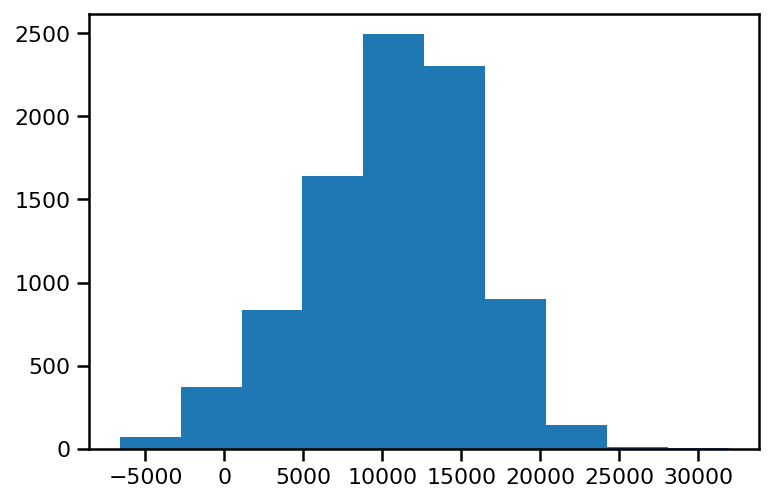

In [33]:
plt.hist(df['load_shortfall_3h']);

In [34]:
df.corr()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Madrid_pressure,Valencia_temp_max,Valencia_temp,Bilbao_weather_id,Seville_temp,Valencia_humidity,Valencia_temp_min,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
Madrid_wind_speed,1.000000,0.259719,0.513092,-0.117892,-0.137092,0.244001,0.377854,0.191251,0.270950,0.294640,-0.095380,0.230126,0.434104,0.062758,0.108413,0.071183,0.011134,0.004795,0.150446,-0.014644,0.021660,-0.169358,-0.099582,-0.231747,-0.120014,-0.157088,0.050043,-0.136672,0.133468,0.128726,-0.238128,0.090861,-0.285787,0.119657,0.061854,0.091464,0.080133,0.077330,0.060467,0.089992,0.042114,0.110278,0.109572,0.098138,-0.150981
Bilbao_rain_1h,0.259719,1.000000,0.265864,0.069878,0.106765,0.370733,0.085398,0.081131,0.279350,0.069997,-0.030723,0.135524,0.140101,0.052558,0.092984,0.096730,0.052458,0.016392,0.187423,-0.001412,0.008269,-0.147768,-0.120618,-0.054814,-0.095723,-0.206765,-0.210323,-0.298587,-0.135198,-0.127953,-0.604616,-0.170009,-0.103868,-0.116835,-0.157326,-0.148397,-0.138901,-0.141269,-0.182494,-0.106593,-0.219871,-0.120575,-0.135927,-0.116431,-0.152510
Valencia_wind_speed,0.513092,0.265864,1.000000,-0.075227,-0.019388,0.210524,0.386478,0.163675,0.248643,0.347966,-0.066071,0.221887,0.316035,0.031804,0.046085,0.115133,0.050282,0.027637,0.093865,-0.037553,0.058629,-0.099056,-0.037605,-0.096374,-0.069092,-0.041408,-0.024045,-0.158475,0.065815,0.072366,-0.201379,-0.008508,-0.413017,0.075533,-0.040998,-0.021970,-0.021456,-0.010166,-0.022676,0.001413,-0.033271,0.003618,-0.011982,-0.019742,-0.142791
Seville_humidity,-0.117892,0.069878,-0.075227,1.000000,0.799831,0.061680,-0.088180,0.399436,-0.087246,-0.138625,0.164064,0.366602,-0.202449,-0.051022,0.227476,0.023556,0.021599,0.034343,0.164019,0.015555,0.007351,-0.228442,-0.050515,-0.099458,-0.328265,-0.088094,-0.566426,-0.103813,-0.650643,-0.663276,-0.105088,-0.743126,0.464012,-0.657427,-0.606770,-0.708937,-0.617797,-0.605493,-0.604733,-0.595065,-0.583718,-0.784850,-0.717171,-0.688664,-0.167290
Madrid_humidity,-0.137092,0.106765,-0.019388,0.799831,1.000000,0.041878,-0.016808,0.374112,-0.069570,-0.058518,0.183725,0.484293,-0.125680,-0.061265,0.195455,0.031653,0.025198,0.059958,0.250614,0.017797,0.012571,-0.341407,-0.051139,-0.053074,-0.291095,-0.168207,-0.576413,-0.121737,-0.705918,-0.706989,-0.139686,-0.738819,0.378980,-0.689854,-0.691803,-0.803260,-0.684867,-0.635760,-0.634825,-0.636777,-0.611395,-0.769591,-0.802605,-0.759633,-0.150536
Bilbao_clouds_all,0.244001,0.370733,0.210524,0.061680,0.041878,1.000000,0.031915,0.046737,0.280154,0.094019,-0.065120,0.109788,0.075066,0.052913,0.041090,0.080180,0.037506,0.009557,0.089281,-0.041013,0.024339,-0.080837,-0.124169,0.000377,-0.033825,-0.079778,-0.102322,-0.135672,0.002621,-0.000299,-0.536205,-0.095003,-0.129684,-0.003806,-0.034040,-0.048491,-0.023171,-0.067731,-0.114118,-0.010804,-0.158014,-0.077417,-0.046686,-0.046189,-0.127293
Bilbao_wind_speed,0.377854,0.085398,0.386478,-0.088180,-0.016808,0.031915,1.000000,0.127344,0.417534,0.275317,-0.018225,0.239326,0.213420,-0.026640,0.073080,-0.001642,0.009572,-0.026037,0.088502,-0.038246,-0.008114,-0.101497,-0.003074,-0.122915,-0.086691,0.054035,0.103342,0.075541,0.091352,0.093919,-0.031661,0.080357,-0.279825,0.093177,0.011151,0.025367,0.018967,0.107302,0.142435,0.023711,0.177123,0.055077,0.031245,0.021425,-0.081602
Seville_clouds_all,0.191251,0.081131,0.163675,0.399436,0.374112,0.046737,0.127344,1.000000,0.053482,0.136591,-0.0

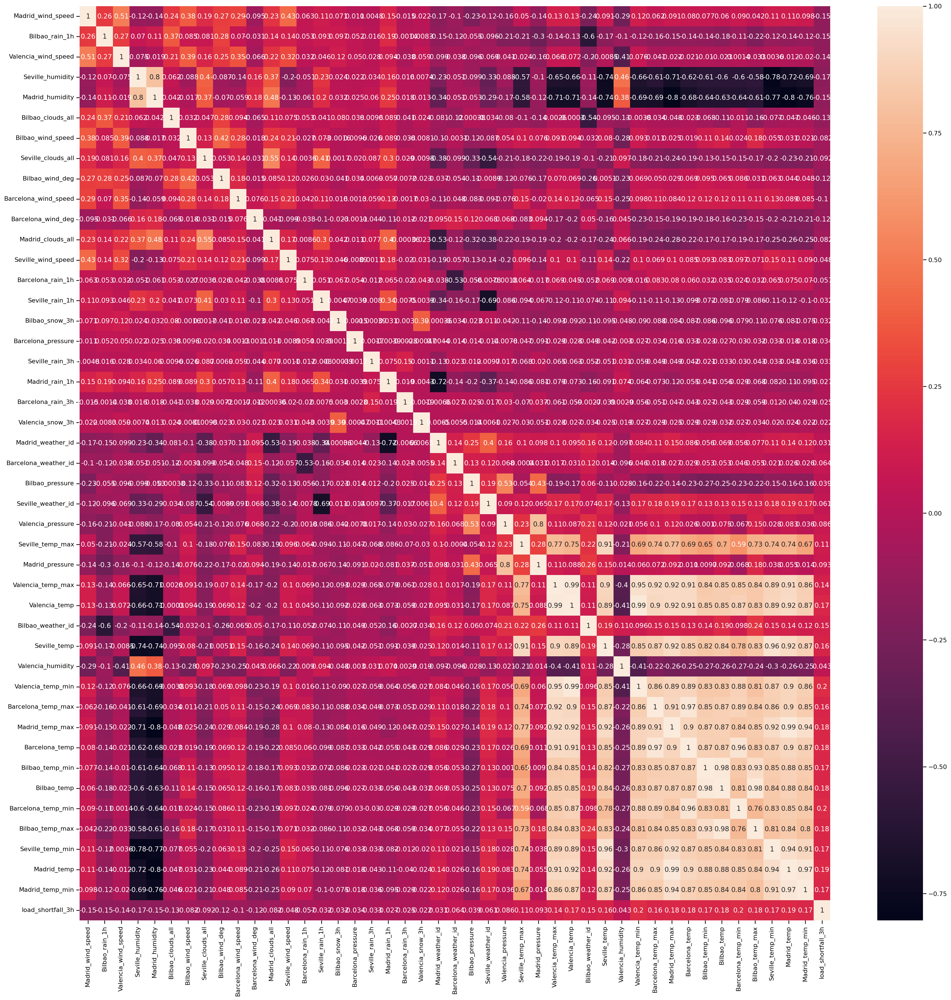

In [35]:
# evaluate correlation
plt.figure(figsize= (30,30))
sns.heatmap(df.corr(), annot=True);

- First, we can easily tell the presence of high correlation (in red) between features on the heatmap at the bottom right corner of our graph
- A breakdown of handling such occurence will be discussed in the feature engineering section of the notebook
- It is important to consider this step when choosing the best features which in turn would result to an improvement of our model.

In [36]:
# have a look at feature distributions

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

We will be carrying out Feature Engineering in this section of our notebook.

We have highlighted some key points to consider -

- Why should we use Feature Engineering in data science?
- Feature Selection/Importance
- Handling missing values
- Handling outliers
- Feature Scaling

#### Why should we use Feature Engineering in data science?
In Data Science, the performance of the model is dependent on data preprocessing and data handling. Suppose if we build a model without Handling data, we got an accuracy of around 70%. By applying the Feature engineering on the same model there is a chance to increase the performance from 70% to more.

Simply, by using Feature Engineering we improve the performance of the model.

Continued -- As we saw in the previous section (EDA), we highlighted some columns to be dropped as well as columns with categorical values.

We will now do the following:

- Drop the Unnammed Column
- Connvert both Seville_pressure and Valencia_wind_degree columns from categorical to numerical values.
- Also, we will be converting or downsampling the Time column to various date/time format viz;

    - Year
    - Month of the Year
    - Week of the Year
    - Day of the Year
    - Day of the Month
    - Day of the Week
    - Hour of the Week
    - Hour of the Day
    - This will enable us have a better and larger expression of our data during modeling

In [37]:
# remove missing values/ features
# fill the missing value in Valencia_pressure with the mean, which is 1012.

df.fillna(df.Valencia_pressure.mean(), inplace= True)
df_test.fillna(df_test.Valencia_pressure.mean(), inplace= True)

In [38]:
df.Seville_pressure = df.Seville_pressure.str[2:]
df_test.Seville_pressure = df_test.Seville_pressure.str[2:]

In [39]:
df['Seville_pressure'] = df['Seville_pressure'].astype(int)
df_test['Seville_pressure'] = df_test['Seville_pressure'].astype(int)

In [40]:
# create new features

In [41]:
df.Seville_pressure.unique()

array([25, 23, 24, 21, 16,  9, 15, 19, 22, 11,  8,  4,  6, 13, 17, 20, 18,
       14, 12,  5, 10,  7,  3,  2,  1])

In [42]:
df.Valencia_wind_deg = df.Valencia_wind_deg.str[6:]

In [43]:
df['Valencia_wind_deg'] = df['Valencia_wind_deg'].astype(int)

In [44]:
df.Valencia_wind_deg.unique()

array([ 5, 10,  9,  8,  7,  6,  4,  3,  1,  2])

In [45]:
# The time is in 'Object' dtype, to change the data type into datetime 
df["time"] = pd.to_datetime(df["time"])

In [46]:
# Extract the date and time into individual components, this will be useful for some visualization
df['Year'] = df['time'].dt.year
df['Month'] = df['time'].dt.month
df['Day'] = df['time'].dt.day
df['Hour'] = df['time'].dt.hour
df['Minutes'] = df['time'].dt.minute
df['Seconds'] = df['time'].dt.second


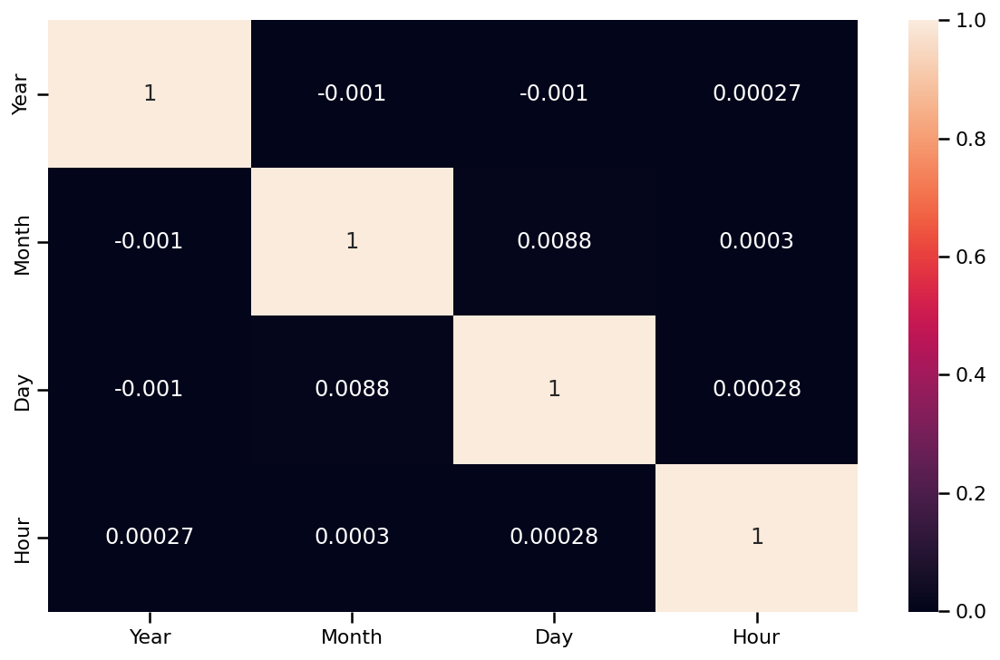

In [47]:
Time_df = df.iloc[:,[-6,-5,-4,-3]]
plt.figure(figsize=[10,6])
sns.heatmap(Time_df.corr(),annot=True );

Looking at our heatmap tells us that we have high Multicollinearity present in our new features. The features involved are -


- Day 
- Month 
- Day 
- Hour 




#### Feature Importance/Selection
Feature selection is the process where you automatically or manually select the features that contribute the most to your prediction variable or output. Selecting the important independent features which have more relation with the dependent feature will help to build a good model. There are some methods for feature selection:

Feature importance gives you a score for each feature of your data. The higher the score, the more important or relevant that feature is to your target feature.

Feature importance is an inbuilt class that comes with tree-based classifiers such as:

Random Forest Classifiers
Extra Tree Classifiers


Correlation Matrix with Heatmap
Heatmap is a graphical representation of 2D (two-dimensional) data. Each data value represented in a matrix.

First, we'll plot the pair plot between all independent features and dependent features. It will give the relation between dependent and independent features. The relation between the independent feature and the dependent feature is less than 0.2 then choose that independent feature for building a model.



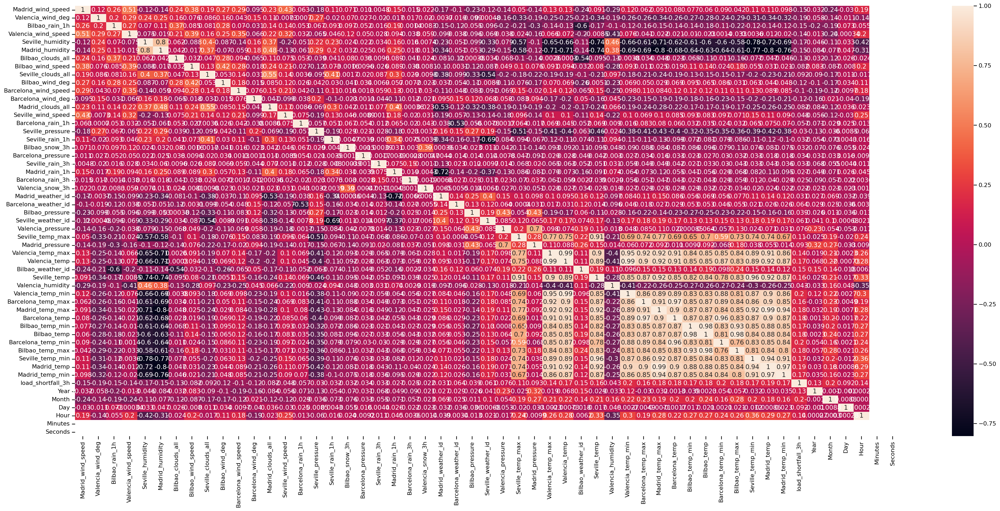

In [48]:
plt.figure(figsize=[35,15])
sns.heatmap(df.corr(),annot=True );

Just as we mentioned in our EDA, we noticed the presence of high correlations between the predictor columns and also possible outliers.

Here, we would have to drop these columns to improve the performance of our model and reduce any possibility of overfitting in our model

Before we drop these columns

Let us check if this approach corresponds with our feature selection.

Using SelectKBest and Chi2 to perform Feature Selection

In [49]:
## Splitting our data into dependent Variable and Independent Variable
X = df.drop(columns = 'load_shortfall_3h')
y = df['load_shortfall_3h'].astype('int')

### Dropping Outliers

We have one more thing to do, which is to remove possible outliers. Also, we will select the important features for our model thus dropping others having multicollinearity

In [50]:
X = X[['Madrid_wind_speed', 'Valencia_wind_deg', 'Bilbao_rain_1h',
       'Valencia_wind_speed', 'Seville_humidity', 'Madrid_humidity',
       'Bilbao_clouds_all', 'Bilbao_wind_speed', 'Seville_clouds_all',
       'Bilbao_wind_deg', 'Barcelona_wind_speed', 'Barcelona_wind_deg',
       'Madrid_clouds_all', 'Seville_wind_speed', 'Barcelona_rain_1h',
       'Seville_pressure', 'Seville_rain_1h', 'Bilbao_snow_3h',
       'Barcelona_pressure', 'Seville_rain_3h', 'Madrid_rain_1h',
       'Barcelona_rain_3h', 'Valencia_snow_3h', 'Madrid_weather_id',
       'Barcelona_weather_id', 'Bilbao_pressure', 'Seville_weather_id',
       'Valencia_pressure', 'Seville_temp_max', 'Bilbao_weather_id', 
        'Valencia_humidity', 'Year', 'Month', 'Day', 'Hour']]

In [51]:
X.kurtosis()

Madrid_wind_speed          2.036462
Valencia_wind_deg         -1.186661
Bilbao_rain_1h            32.904656
Valencia_wind_speed       35.645426
Seville_humidity          -1.017983
Madrid_humidity           -1.167537
Bilbao_clouds_all         -1.533417
Bilbao_wind_speed          3.631565
Seville_clouds_all         2.155921
Bilbao_wind_deg           -1.083530
Barcelona_wind_speed       1.493635
Barcelona_wind_deg        -0.959160
Madrid_clouds_all          0.142079
Seville_wind_speed         1.398580
Barcelona_rain_1h        101.578931
Seville_pressure          -1.220040
Seville_rain_1h           93.840746
Bilbao_snow_3h           806.128471
Barcelona_pressure      3687.564230
Seville_rain_3h          413.136592
Madrid_rain_1h            76.584491
Barcelona_rain_3h        187.800460
Valencia_snow_3h        4089.323165
Madrid_weather_id          9.259047
Barcelona_weather_id       5.701882
Bilbao_pressure            1.825323
Seville_weather_id        10.710308
Valencia_pressure          3

## Treating Outliers
#### outliers_colunms = 'Barcelona_pressure', 'Barcelona_rain_1h','Barcelona_rain_3h', 'Bilbao_rain_1h', 'Bilbao_snow_3h',  'Madrid_rain_1h', 'Seville_rain_1h', 'Seville_rain_3h', 'Valencia_snow_3h', 'Valencia_wind_speed'

In [52]:
outliers_columns = X[['Barcelona_pressure',
               'Barcelona_rain_1h',
               'Barcelona_rain_3h', 
              'Bilbao_rain_1h', 
              'Bilbao_snow_3h', 
              'Madrid_rain_1h',
              'Seville_rain_1h',
              'Seville_rain_3h',
              'Valencia_snow_3h',
             'Valencia_wind_speed']]

In [53]:
# Normalizing columns with outliers, by removing the outliers and then replacing it with null 

for i in ['Barcelona_pressure', 
          'Barcelona_rain_1h', 
               'Barcelona_rain_3h', 
              'Bilbao_rain_1h', 
              'Bilbao_snow_3h', 
              'Madrid_rain_1h',
              'Seville_rain_1h',
              'Seville_rain_3h',
              'Valencia_snow_3h',
             'Valencia_wind_speed']: # looping through each outliers colunms
    q75,q25 = np.percentile(outliers_columns.loc[:,i],[75,25]) # The 1st and 3rd percentile
    intr_qr = q75-q25 # finding the inter_quartile 
 
    max = q75+(1.5*intr_qr) # finding the maximun value
    min = q25-(1.5*intr_qr) # finding the minimum
 
    outliers_columns.loc[outliers_columns[i] < min,i] = np.nan 
    outliers_columns.loc[outliers_columns[i] > max,i] = np.nan 


In [54]:
# replacing the X columns with the outliers_columns with null values for outliers datapoint 

X['Barcelona_pressure'] = outliers_columns['Barcelona_pressure']
X['Barcelona_rain_1h'] = outliers_columns['Barcelona_rain_1h']
X['Barcelona_rain_3h'] = outliers_columns['Barcelona_rain_3h']
X['Bilbao_rain_1h'] = outliers_columns['Bilbao_rain_1h']
X['Bilbao_snow_3h'] = outliers_columns['Bilbao_snow_3h']
X['Madrid_rain_1h'] = outliers_columns['Madrid_rain_1h']
X['Seville_rain_1h'] = outliers_columns['Seville_rain_1h']
X['Seville_rain_3h'] = outliers_columns['Seville_rain_3h']
X['Valencia_snow_3h'] = outliers_columns['Valencia_snow_3h']
X['Valencia_wind_speed'] = outliers_columns['Valencia_wind_speed']

In [55]:
# fliing the null values with the mean
X['Barcelona_pressure'] = X['Barcelona_pressure'].fillna(X['Barcelona_pressure'].mean())
X['Barcelona_rain_1h'] = X['Barcelona_rain_1h'].fillna(X['Barcelona_rain_1h'].mean())
X['Barcelona_rain_3h'] = X['Barcelona_rain_3h'].fillna(X['Barcelona_rain_3h'].mean())
X['Bilbao_rain_1h'] = X['Bilbao_rain_1h'].fillna(X['Bilbao_rain_1h'].mean())
X['Bilbao_snow_3h'] = X['Bilbao_snow_3h'].fillna(X['Bilbao_snow_3h'].mean())
X['Madrid_rain_1h'] = X['Madrid_rain_1h'].fillna(X['Madrid_rain_1h'].mean())
X['Seville_rain_1h'] = X['Seville_rain_1h'].fillna(X['Seville_rain_1h'].mean())
X['Seville_rain_3h'] = X['Seville_rain_3h'].fillna(X['Seville_rain_3h'].mean())
X['Valencia_snow_3h'] = X['Valencia_snow_3h'].fillna(X['Valencia_snow_3h'].mean())
X['Valencia_wind_speed'] = X['Valencia_wind_speed'].fillna(X['Valencia_wind_speed'].mean())

In [56]:
X.kurtosis()

Madrid_wind_speed        2.036462
Valencia_wind_deg       -1.186661
Bilbao_rain_1h           7.408979
Valencia_wind_speed      0.445823
Seville_humidity        -1.017983
Madrid_humidity         -1.167537
Bilbao_clouds_all       -1.533417
Bilbao_wind_speed        3.631565
Seville_clouds_all       2.155921
Bilbao_wind_deg         -1.083530
Barcelona_wind_speed     1.493635
Barcelona_wind_deg      -0.959160
Madrid_clouds_all        0.142079
Seville_wind_speed       1.398580
Barcelona_rain_1h        0.000000
Seville_pressure        -1.220040
Seville_rain_1h          0.000000
Bilbao_snow_3h           0.000000
Barcelona_pressure       0.214952
Seville_rain_3h          0.000000
Madrid_rain_1h           0.000000
Barcelona_rain_3h        0.000000
Valencia_snow_3h         0.000000
Madrid_weather_id        9.259047
Barcelona_weather_id     5.701882
Bilbao_pressure          1.825323
Seville_weather_id      10.710308
Valencia_pressure        3.821219
Seville_temp_max        -0.515989
Bilbao_weather

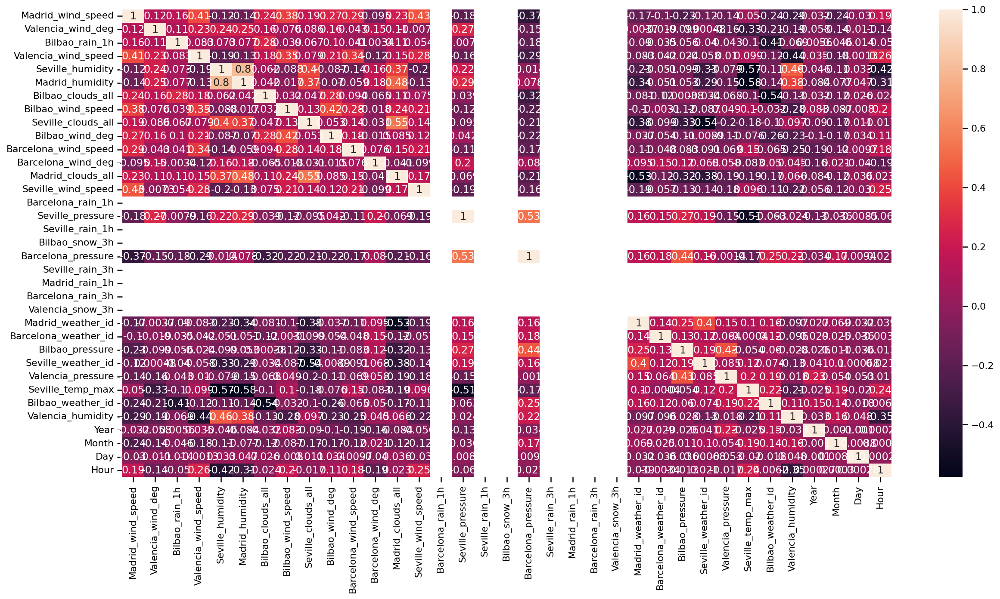

In [57]:
plt.figure(figsize=[20,10])
sns.heatmap(X.corr(),annot=True);

We have been able to remove the collinearity seen in previous heatmaps and also selected specific features to train our model with

#### Feature Scaling
Lastly, before we carry out modeling, it is important to scale our data. As we saw during the EDA, we noticed how some columns(features) had values that were out of range when we compared their mean, max and standard deviation. This can result to bias in the model during decision making, thus it is important to convert all the column values to a certain range/scale.

What is Feature Scaling?
Feature scaling is the process of normalising the range of features in a dataset. Real-world datasets often contain features that are varying in degrees of magnitude, range and units. Therefore, in order for machine learning models to interpret these features on the same scale, we need to perform feature scaling.

In this project, we will be carrying out *Standard Scaling, becasue of it's robustness* to outliers

In [58]:
# Create standardization object
scaler = StandardScaler()

In [59]:
# Save standardized features into new variable
#We used a fit transform method, which first fits in the standardscaler and then transforms the data
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled,columns=X.columns)
X_scaled.head()

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_pressure,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Bilbao_weather_id,Valencia_humidity,Year,Month,Day,Hour
0,-0.950708,-0.096053,-0.419691,-0.962914,0.516117,0.270621,-1.335491,-0.501451,-0.565065,0.630823,1.932284,-1.660205,-0.694188,0.542975,0.0,1.588087,0.0,0.0,8.731933e-13,0.0,0.0,0.0,0.0,0.342424,0.385993,1.718219,0.352274,-1.129531e+00,-2.616796,0.649842,0.540928,-1.226179,-1.602429,-1.675368,-1.090901
1,-1.130863,1.641580,-0.419691,-0.367281,0.692953,0.298017,-1.335491,-0.501451,-0.565065,0.607959,0.630270,-0.578686,-0.694188,0.542975,0.0,1.588087,0.0,0.0,8.731933e-13,0.0,0.0,0.0,0.0,0.342424,0.385993,1.784583,0.352274,-9.289340e-01,-2.539014,0.649842,0.298645,-1.226179,-1.602429,-1.675368,-0.654451
2,-0.770554,1.294054,-0.419691,-0.764370,0.383491,0.284319,-1.335491,-0.501451,-0.565065,0.542632,-0.485743,1.520733,-0.694188,0.144442,0.0,1.588087,0.0,0.0,8.731933e-13,0.0,0.0,0.0,0.0,0.342424,0.385993,1.817765,0.352274,-8.085757e-01,-2.105564,0.649842,0.021750,-1.226179,-1.602429,-1.675368,-0.218001
3,-0.770554,0.946527,-0.419691,-0.764370,0.118238,-0.044439,-1.335491,-0.501451,-0.565065,0.398912,-0.299741,0.925711,-0.694188,0.941509,0.0,1.588087,0.0,0.0,8.731933e-13,0.0,0.0,0.0,0.0,0.342424,0.385993,1.817765,0.352274,-3.672620e-01,-1.361703,0.649842,-0.583957,-1.226179,-1.602429,-1.675368,0.218449
4,-0.770554,0.599000,-0.419691,-0.764370,-0.161751,-0.017043,-1.274045,-0.894581,-0.565065,0.255192,0.816272,0.779762,-0.694188,0.343708,0.0,1.588087,0.0,0.0,8.731933e-13,0.0,0.0,0.0,0.0,0.342424,0.385993,1.751401,0.352274,2.736630e-13,-1.348214,0.649842,-0.358980,-1.226179,-1.602429,-1.675368,0.654899


In [60]:
y.head()

0    6715
1    4171
2    4274
3    5075
4    6620
Name: load_shortfall_3h, dtype: int64

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

#### Model Building
We'll split the data into train and test, to be able to evaluate the model that we build on the train data.

Build a Linear Regression model which would serve as our base model using the train data.

Try and improve the linear model by employing Lasso and Ridge

Try out other models like decision trees, Random Forest and SVR

In [61]:
#Separating our models into training set and testing set
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state = 42)

What we did here was to split our data into 80% for training and the remaining 20% for testing i.e test_size = 0.2

We made use of the train_test_split syntax from the sklearn library to carry out the splitting

In [62]:
#checking the shape of the training and testing data

print('Training predictor:', X_train.shape)
print('Training target:', y_train.shape)
print('Testing predictor:', X_test.shape)
print('Testing target:', y_test.shape)

Training predictor: (7010, 35)
Training target: (7010,)
Testing predictor: (1753, 35)
Testing target: (1753,)


We have been able to allocate 7010 features/observations to the training set of our data.

We have also allocated the remainder i.e 1753 of observations to the testing set of our data.

N/B: These values are as a result of the splitting ratio carried out, it is important to note that any change in the splitting ration would affect the value and shape of the training and testing sets

In [63]:
#Instantiate the model
lm = LinearRegression()
#Fit the model into training set
lm.fit(X_train, y_train)

#predict on unseen data
predict = lm.predict(X_test)
train_predict = lm.predict(X_train) #predicting on the same training set

In [67]:
# Create LASSO model object, setting alpha to 0.01
""" when alpha is 0, Lasso regression produces the same coefficients as a linear regression. When alpha is very very large, all coefficients are zero."""
lasso = Lasso(alpha=0.01)
# Train the LASSO model
lasso.fit(X_train, y_train)
# Get predictions
lasso_pred = lasso.predict(X_test)

In [68]:
# Creating Ridge model
Ridge = Ridge()
# Train the model
Ridge.fit(X_train, y_train)
# Get predictions
Ridge_pred = Ridge.predict(X_test)

In [69]:
# Instantiate support vector regression model
Sv_reg = SVR(kernel='rbf', gamma='auto')
# Train the model
Sv_reg.fit(X_train,y_train)
# Get predictions
SV_pred = Sv_reg.predict(X_test)

In [70]:
# Instantiate regression tree model
Reg_tree = DecisionTreeRegressor(random_state=42)
# Fitting the model
Reg_tree.fit(X_train,y_train)
Tree_pred = Reg_tree.predict(X_test)

In [71]:
# Our forest consists of 200 trees with a max depth of 8 
RF = RandomForestRegressor(n_estimators=200, max_depth=8)
# Fitting the model
RF.fit(X_train,y_train)
RF_predict = RF.predict(X_test)

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [72]:
# Compare model performance
#Comparing the True value and the Predicted Value of our models
Linear = pd.DataFrame({'Actual': y_test, 'Predicted': predict})
Lass_ = pd.DataFrame({'Actual': y_test, 'Predicted': lasso_pred})
Ridge_ = pd.DataFrame({'Actual': y_test, 'Predicted': Ridge_pred})
Sv_ = pd.DataFrame({'Actual': y_test, 'Predicted': SV_pred})
Des_ = pd.DataFrame({'Actual': y_test, 'Predicted': Tree_pred})
Rand_ = pd.DataFrame({'Actual': y_test, 'Predicted': RF_predict})

In [73]:
print(Linear.head()) #Linear Model 
print('\n')
print(Lass_.head()) # Lasso Model
print('\n')
print(Ridge_.head()) # Ridge Model
print('\n')
print(Sv_.head()) #SVR Model
print('\n')
print(Des_.head()) #Decision Tree Model
print('\n')
print(Rand_.head()) # Random Forest Model

      Actual     Predicted
1226   11450  11795.653097
7903   13693  12328.805151
1559   18337  11578.129579
3621   -1221   8621.570282
7552    8515  13835.618451


      Actual     Predicted
1226   11450  11795.620344
7903   13693  12328.783809
1559   18337  11578.128009
3621   -1221   8621.593550
7552    8515  13835.506817


      Actual     Predicted
1226   11450  11795.368138
7903   13693  12328.639330
1559   18337  11578.229847
3621   -1221   8621.746025
7552    8515  13834.984586


      Actual     Predicted
1226   11450  11118.923625
7903   13693  11077.020635
1559   18337  11199.024449
3621   -1221  10990.706835
7552    8515  11210.200037


      Actual  Predicted
1226   11450     8409.0
7903   13693    11686.0
1559   18337     7980.0
3621   -1221     1343.0
7552    8515    10539.0


      Actual     Predicted
1226   11450   7628.073698
7903   13693  14784.144773
1559   18337  13145.922470
3621   -1221   4688.044636
7552    8515  10501.787749


In [76]:
Model_Performance = { 
    
                      'Test RMSE':
                    
                        {"Linear model": np.sqrt(metrics.mean_squared_error(y_test,predict)),
                        "Ridge": np.sqrt(metrics.mean_squared_error(y_test,Ridge_pred)),
                        "Lasso" : np.sqrt(metrics.mean_squared_error(y_test,lasso_pred)),
                         "SVR" : np.sqrt(metrics.mean_squared_error(y_test,SV_pred)),
                        "Decision Tree" : np.sqrt(metrics.mean_squared_error(y_test,Tree_pred)),
                        "Random Forest" : np.sqrt(metrics.mean_squared_error(y_test,RF_predict))}
                        
                    }

# create dataframe from dictionary
Model_Performance = pd.DataFrame(data=Model_Performance)
Model_Performance

,Test RMSE
Decision Tree,4303.898790
Lasso,4911.260548
Linear model,4911.256998
Random Forest,3595.497825
Ridge,4911.267356
SVR,5297.161369


In [77]:
px.bar(Model_Performance, y =Model_Performance['Test RMSE'],
       color = Model_Performance.index, width =700, height=400)

In [78]:
Model_Performance2 = { 
    
                      'Test MSE':
                    
                        {"Linear model": (metrics.mean_squared_error(y_test,predict)),
                        "Ridge": (metrics.mean_squared_error(y_test,Ridge_pred)),
                        "Lasso" : (metrics.mean_squared_error(y_test,lasso_pred)),
                         "SVR" : (metrics.mean_squared_error(y_test,SV_pred)),
                        "Decision Tree" : (metrics.mean_squared_error(y_test,Tree_pred)),
                        "Random Forest" : (metrics.mean_squared_error(y_test,RF_predict))}
                        
                    }

# create dataframe from dictionary
Model_Performance2 = pd.DataFrame(data=Model_Performance2)
Model_Performance2

,Test MSE
Decision Tree,1.852354e+07
Lasso,2.412048e+07
Linear model,2.412045e+07
Random Forest,1.292760e+07
Ridge,2.412055e+07
SVR,2.805992e+07


In [79]:
px.bar(Model_Performance2, y =Model_Performance2['Test MSE'],
       color = Model_Performance2.index, width =700, height=400)

In [80]:
Model_Performance3= { 
    
                      'Test MAE':
                    
                        {"Linear model": (metrics.mean_absolute_error(y_test,predict)),
                        "Ridge": (metrics.mean_absolute_error(y_test,Ridge_pred)),
                        "Lasso" : (metrics.mean_absolute_error(y_test,lasso_pred)),
                         "SVR" : (metrics.mean_absolute_error(y_test,SV_pred)),
                        "Decision Tree" : (metrics.mean_absolute_error(y_test,Tree_pred)),
                        "Random Forest" : (metrics.mean_absolute_error(y_test,RF_predict))}
                        
                    }

# create dataframe from dictionary
Model_Performance3 = pd.DataFrame(data=Model_Performance3)
Model_Performance3

,Test MAE
Decision Tree,3204.729036
Lasso,3935.472293
Linear model,3935.467917
Random Forest,2866.660109
Ridge,3935.484285
SVR,4228.772868


In [81]:
px.bar(Model_Performance3, y =Model_Performance3['Test MAE'],
       color = Model_Performance3.index, width =700, height=400)

In [82]:
Model_Performance4= { 
    
                      'Test R^2':
                    
                        {"Linear model": (metrics.r2_score(y_test,predict)),
                        "Ridge": (metrics.r2_score(y_test,Ridge_pred)),
                        "Lasso" : (metrics.r2_score(y_test,lasso_pred)),
                         "SVR" : (metrics.r2_score(y_test,SV_pred)),
                        "Decision Tree" : (metrics.r2_score(y_test,Tree_pred)),
                        "Random Forest" : (metrics.r2_score(y_test,RF_predict))}
                        
                    }

# create dataframe from dictionary
Model_Performance4 = pd.DataFrame(data=Model_Performance4)
Model_Performance4

,Test R^2
Decision Tree,0.342255
Lasso,0.143516
Linear model,0.143517
Random Forest,0.540959
Ridge,0.143513
SVR,0.003632


In [83]:
px.bar(Model_Performance4, y =Model_Performance4['Test R^2'],
       color = Model_Performance4.index, width =700, height=400)

In [65]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [66]:
# discuss chosen methods logic